# Regresiones

* Regresión Lineal y los mínimos cuadrados
* Regresión de Ridge y la contracción
* Regresión de Lasso y la regularización de pesos
* Regresión de Elastic-Net y la combinación de Ridge y Lasso 
* Regresión Logística
* Modelos Lineales Generalizados
* Regresión por Soporte Vectorial y las funciones Kernel

## Generación de datos lineales con ruido

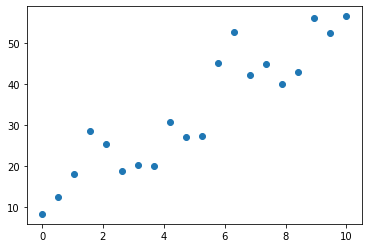

In [33]:
import numpy as np
import matplotlib.pyplot as plt

A = 0
B = 10
N = 20
K = 2.5

m = 6
b = 4

x = np.linspace(A, B, N)
y = m * (x + np.random.uniform(-1, 1, N) * K) + b

plt.scatter(x, y)

## Regresión Lineal

In [34]:
from sklearn.linear_model import LinearRegression

reg = LinearRegression()

X = x.reshape((N, 1))

reg.fit(X, y)

reg.score(X, y)

0.8456758538205309

In [35]:
"w", reg.coef_, "w0", reg.intercept_

('w', array([4.43171454]), 'w0', 11.26993045933952)

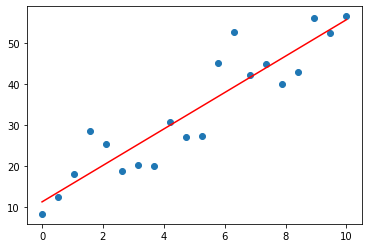

In [36]:
y_predict = reg.predict(X)

plt.scatter(x, y)
plt.plot(x, y_predict, "red")

## Regresión de Ridge

In [37]:
from sklearn.linear_model import Ridge

reg = Ridge()

X = x.reshape((N, 1))

reg.fit(X, y)

reg.score(X, y)

0.8456512006602759

In [38]:
"w", reg.coef_, "w0", reg.intercept_

('w', array([4.40778656]), 'w0', 11.389570380118673)

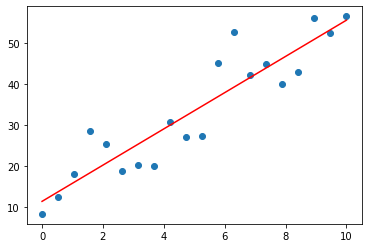

In [39]:
y_predict = reg.predict(X)

plt.scatter(x, y)
plt.plot(x, y_predict, "red")

alpha(-1000) R^2(-0.42503791612415864)
[-1.00070973] 38.43205182849232
--
alpha(-100) R^2(-0.34685923691857656)
[9.69437555] -15.043374617027261
--
alpha(0) R^2(0.8456758538205309)
[4.43171454] 11.269930459339513
--
alpha(100) R^2(0.7409814151273855)
[2.87240757] 19.066465296781523
--
alpha(1000) R^2(0.24263588694801408)
[0.68937782] 29.981614069200333
--


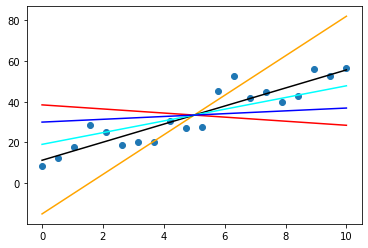

In [45]:
plt.scatter(x, y)

colors = ["red", "orange", "black", "cyan", "blue"]

for index, alpha in enumerate([-1000, -100, 0, 100, 1000]):
    reg = Ridge(alpha=alpha)

    reg.fit(X, y)

    y_predict = reg.predict(X)

    print("alpha({}) R^2({})".format(alpha, reg.score(X, y)))
    print(reg.coef_, reg.intercept_)
    print("--")

    plt.plot(x, y_predict, colors[index])

## Regresión de Lasso

In [46]:
from sklearn.linear_model import Lasso

reg = Lasso()

X = x.reshape((N, 1))

reg.fit(X, y)

reg.score(X, y)

0.8451682890408507

In [47]:
"w", reg.coef_, "w0", reg.intercept_

('w', array([4.32314311]), 'w0', 11.812787602196657)

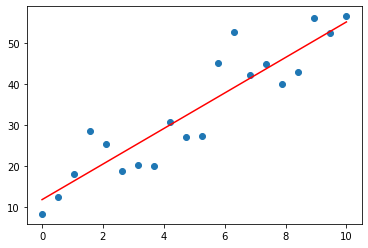

In [48]:
y_predict = reg.predict(X)

plt.scatter(x, y)
plt.plot(x, y_predict, "red")

alpha(-100) R^2(-4.229971942980675)
[15.2888574] -43.015783826374765
--
alpha(-10) R^2(0.7949193758525188)
[5.51742882] 5.841359030768086
--
alpha(1) R^2(0.8451682890408507)
[4.32314311] 11.812787602196657
--
alpha(10) R^2(0.7949193758525188)
[3.34600025] 16.698501887910943
--
alpha(100) R^2(0.0)
[0.] 33.428503155227325
--


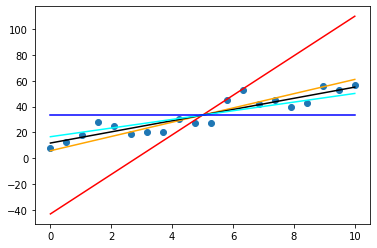

In [58]:
plt.scatter(x, y)

colors = ["red", "orange", "black", "cyan", "blue"]

for index, alpha in enumerate([-100, -10, 1, 10, 100]):
    reg = Lasso(alpha=alpha)

    reg.fit(X, y)

    y_predict = reg.predict(X)

    print("alpha({}) R^2({})".format(alpha, reg.score(X, y)))
    print(reg.coef_, reg.intercept_)
    print("--")

    plt.plot(x, y_predict, colors[index])

## Elastic-Net

In [59]:
from sklearn.linear_model import ElasticNet

reg = ElasticNet()

X = x.reshape((N, 1))

reg.fit(X, y)

reg.score(X, y)

0.8423077248027139

In [60]:
"w", reg.coef_, "w0", reg.intercept_

('w', array([4.15203276]), 'w0', 12.668339351539696)

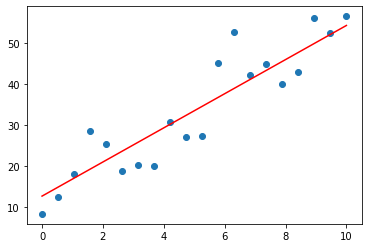

In [61]:
y_predict = reg.predict(X)

plt.scatter(x, y)
plt.plot(x, y_predict, "red")

alpha(1) l1-ratio(0.5) R^2(0.8423077248027139)
[4.15203276] 12.668339351539696
--
alpha(1) l1-ratio(0.2) R^2(0.8396483654106359)
[4.05757121] 13.14064709959974
--
alpha(0.5) l1-ratio(0.5) R^2(0.8447887311648663)
[4.28817827] 11.987611796226673
--
alpha(0.2) l1-ratio(1) R^2(0.8456555512293437)
[4.41000025] 11.37850188791094
--


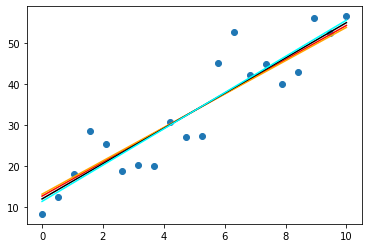

In [65]:
plt.scatter(x, y)

colors = ["red", "orange", "black", "cyan", "blue"]

for index, (alpha, ratio) in enumerate([(1, 0.5), (1, 0.2), (0.5, 0.5), (0.2, 1)]):
    reg = ElasticNet(alpha=alpha, l1_ratio=ratio)

    reg.fit(X, y)

    y_predict = reg.predict(X)

    print("alpha({}) l1-ratio({}) R^2({})".format(alpha, ratio, reg.score(X, y)))
    print(reg.coef_, reg.intercept_)
    print("--")

    plt.plot(x, y_predict, colors[index])

array([1.11471159, 1.58522359, 1.46338301, 2.05573559, 2.2300713 ,
       2.14646792, 2.404407  ])

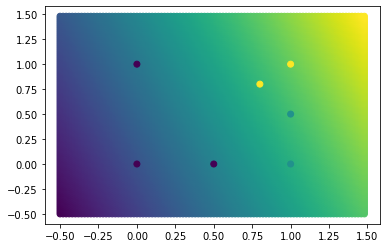

In [132]:
from sklearn.linear_model import ElasticNet

X = np.array([
    [0, 0],
    [0.5, 0],
    [0, 1],
    [1, 0],
    [1, 0.5],
    [0.8, 0.8],
    [1, 1]
])

y = [1, 1, 1, 2, 2, 3, 3]

reg = ElasticNet(alpha=0.1, l1_ratio=1)

reg.fit(X, y)

y_predict = reg.predict(X)

x_min, x_max = X[:, 0].min() - .5, X[:, 0].max() + .5
y_min, y_max = X[:, 1].min() - .5, X[:, 1].max() + .5
h = .02  # step size in the mesh
xx, yy = np.meshgrid(np.arange(x_min, x_max, h), np.arange(y_min, y_max, h))
Z = reg.predict(np.c_[xx.ravel(), yy.ravel()])

x1, x2 = zip(*X)

plt.scatter(xx, yy, c=Z)
plt.scatter(x1, x2, c=y)

y_predict


## Regresión Logística

array([1, 1, 1, 2, 2, 3, 3])

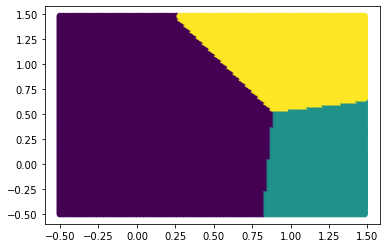

In [110]:
from sklearn.linear_model import LogisticRegression

X = np.array([
    [0, 0],
    [0.5, 0],
    [0, 1],
    [1, 0],
    [1, 0.5],
    [0.8, 0.8],
    [1, 1]
])

y = [1, 1, 1, 2, 2, 3, 3]

reg = LogisticRegression()

reg.fit(X, y)

y_predict = reg.predict(X)

x_min, x_max = X[:, 0].min() - .5, X[:, 0].max() + .5
y_min, y_max = X[:, 1].min() - .5, X[:, 1].max() + .5
h = .02  # step size in the mesh
xx, yy = np.meshgrid(np.arange(x_min, x_max, h), np.arange(y_min, y_max, h))
Z = reg.predict(np.c_[xx.ravel(), yy.ravel()])

x1, x2 = zip(*X)

plt.scatter(xx, yy, c=Z)
plt.scatter(x1, x2, c=y)

y_predict


## Modelos Lineales Generalizados

### Regresión de Poisson

array([1.53244847, 1.6968308 , 1.74539131, 1.87884606, 2.00513982,
       2.00168473, 2.1399229 ])

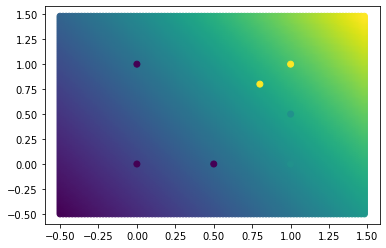

In [111]:
from sklearn.linear_model import PoissonRegressor

X = np.array([
    [0, 0],
    [0.5, 0],
    [0, 1],
    [1, 0],
    [1, 0.5],
    [0.8, 0.8],
    [1, 1]
])

y = [1, 1, 1, 2, 2, 3, 3]

reg = PoissonRegressor()

reg.fit(X, y)

y_predict = reg.predict(X)

x_min, x_max = X[:, 0].min() - .5, X[:, 0].max() + .5
y_min, y_max = X[:, 1].min() - .5, X[:, 1].max() + .5
h = .02  # step size in the mesh
xx, yy = np.meshgrid(np.arange(x_min, x_max, h), np.arange(y_min, y_max, h))
Z = reg.predict(np.c_[xx.ravel(), yy.ravel()])

x1, x2 = zip(*X)

plt.scatter(xx, yy, c=Z)
plt.scatter(x1, x2, c=y)

y_predict

### Regresión Tweedie

array([1.64538867, 1.76040378, 1.79482777, 1.87541889, 1.95013844,
       1.94896412, 2.02485799])

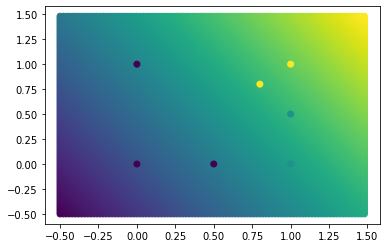

In [112]:
from sklearn.linear_model import TweedieRegressor

X = np.array([
    [0, 0],
    [0.5, 0],
    [0, 1],
    [1, 0],
    [1, 0.5],
    [0.8, 0.8],
    [1, 1]
])

y = [1, 1, 1, 2, 2, 3, 3]

reg = TweedieRegressor()

reg.fit(X, y)

y_predict = reg.predict(X)

x_min, x_max = X[:, 0].min() - .5, X[:, 0].max() + .5
y_min, y_max = X[:, 1].min() - .5, X[:, 1].max() + .5
h = .02  # step size in the mesh
xx, yy = np.meshgrid(np.arange(x_min, x_max, h), np.arange(y_min, y_max, h))
Z = reg.predict(np.c_[xx.ravel(), yy.ravel()])

x1, x2 = zip(*X)

plt.scatter(xx, yy, c=Z)
plt.scatter(x1, x2, c=y)

y_predict

### Regressión Gamma

array([1.6110217 , 1.71807159, 1.74682265, 1.83223477, 1.9078966 ,
       1.90512341, 1.98668286])

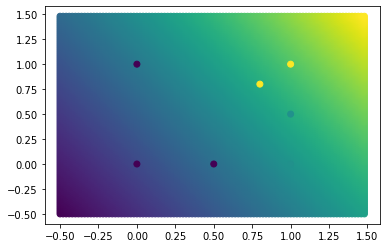

In [113]:
from sklearn.linear_model import GammaRegressor

X = np.array([
    [0, 0],
    [0.5, 0],
    [0, 1],
    [1, 0],
    [1, 0.5],
    [0.8, 0.8],
    [1, 1]
])

y = [1, 1, 1, 2, 2, 3, 3]

reg = GammaRegressor()

reg.fit(X, y)

y_predict = reg.predict(X)

x_min, x_max = X[:, 0].min() - .5, X[:, 0].max() + .5
y_min, y_max = X[:, 1].min() - .5, X[:, 1].max() + .5
h = .02  # step size in the mesh
xx, yy = np.meshgrid(np.arange(x_min, x_max, h), np.arange(y_min, y_max, h))
Z = reg.predict(np.c_[xx.ravel(), yy.ravel()])

x1, x2 = zip(*X)

plt.scatter(xx, yy, c=Z)
plt.scatter(x1, x2, c=y)

y_predict

## Regresión con Soporte Vectorial

### Lineal

array([0.90026667, 1.39986666, 1.3018666 , 1.89946665, 2.10026662,
       2.0209066 , 2.30106658])

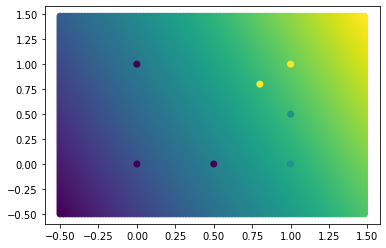

In [115]:
from sklearn.svm import SVR

X = np.array([
    [0, 0],
    [0.5, 0],
    [0, 1],
    [1, 0],
    [1, 0.5],
    [0.8, 0.8],
    [1, 1]
])

y = [1, 1, 1, 2, 2, 3, 3]

reg = SVR(kernel="linear")

reg.fit(X, y)

y_predict = reg.predict(X)

x_min, x_max = X[:, 0].min() - .5, X[:, 0].max() + .5
y_min, y_max = X[:, 1].min() - .5, X[:, 1].max() + .5
h = .02  # step size in the mesh
xx, yy = np.meshgrid(np.arange(x_min, x_max, h), np.arange(y_min, y_max, h))
Z = reg.predict(np.c_[xx.ravel(), yy.ravel()])

x1, x2 = zip(*X)

plt.scatter(xx, yy, c=Z)
plt.scatter(x1, x2, c=y)

y_predict

### Polinomial

array([0.98609554, 1.1003585 , 1.10001792, 1.90019918, 2.09940383,
       2.068421  , 3.10001245])

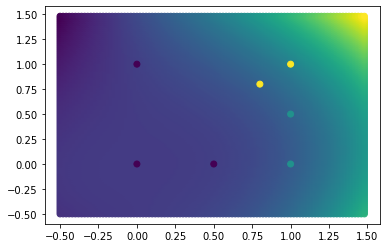

In [116]:
from sklearn.svm import SVR

X = np.array([
    [0, 0],
    [0.5, 0],
    [0, 1],
    [1, 0],
    [1, 0.5],
    [0.8, 0.8],
    [1, 1]
])

y = [1, 1, 1, 2, 2, 3, 3]

reg = SVR(kernel="poly")

reg.fit(X, y)

y_predict = reg.predict(X)

x_min, x_max = X[:, 0].min() - .5, X[:, 0].max() + .5
y_min, y_max = X[:, 1].min() - .5, X[:, 1].max() + .5
h = .02  # step size in the mesh
xx, yy = np.meshgrid(np.arange(x_min, x_max, h), np.arange(y_min, y_max, h))
Z = reg.predict(np.c_[xx.ravel(), yy.ravel()])

x1, x2 = zip(*X)

plt.scatter(xx, yy, c=Z)
plt.scatter(x1, x2, c=y)

y_predict

### Base Radial

array([1.10021339, 1.10013908, 1.09983948, 1.90013903, 2.11431912,
       2.63735155, 2.89966899])

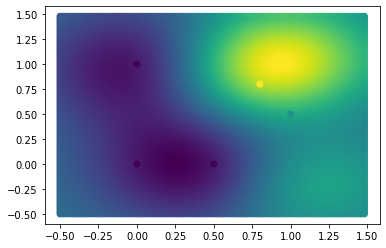

In [117]:
from sklearn.svm import SVR

X = np.array([
    [0, 0],
    [0.5, 0],
    [0, 1],
    [1, 0],
    [1, 0.5],
    [0.8, 0.8],
    [1, 1]
])

y = [1, 1, 1, 2, 2, 3, 3]

reg = SVR(kernel="rbf")

reg.fit(X, y)

y_predict = reg.predict(X)

x_min, x_max = X[:, 0].min() - .5, X[:, 0].max() + .5
y_min, y_max = X[:, 1].min() - .5, X[:, 1].max() + .5
h = .02  # step size in the mesh
xx, yy = np.meshgrid(np.arange(x_min, x_max, h), np.arange(y_min, y_max, h))
Z = reg.predict(np.c_[xx.ravel(), yy.ravel()])

x1, x2 = zip(*X)

plt.scatter(xx, yy, c=Z)
plt.scatter(x1, x2, c=y)

y_predict